<a href="https://www.kaggle.com/code/omborse771924/electoral-integrity-in-2016-us-election-eda?scriptVersionId=333182696" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings("ignore")

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

# Use the kagglehub client library to attach Kaggle resources like competitions, datasets, and models to your session
# Learn more about kagglehub: https://github.com/Kaggle/kagglehub/blob/main/README.md

import kagglehub
# kagglehub.dataset_download('<owner>/<dataset-slug>')

/kaggle/input/datasets/organizations/harvard-university/electoral-integrity/survey.csv


## Loading Dataset

In [2]:
df = pd.read_csv('/kaggle/input/datasets/organizations/harvard-university/electoral-integrity/survey.csv')

In [3]:
df.head()

,Election Year,Expert ID,State,Sex,Age Range,Politician,Candidate,Activist,Monitor,Election Official,...,Electoral Authorities Index,Election Rigged,Deadlines Restrictive,Voters Waited,Voters Intimidated,Multiple Ballots Cast,Machines Accurate,Records Secure,Votes Counted Quickly,Outcome Reflected Popular Will
0,2016,1,Alabama,Male,50-59,NaN,NaN,NaN,NaN,NaN,...,68.75,Disagree,Disagree,Strongly Agree,Don't Know,Don't Know,Agree,Don't Know,Agree,Disagree
1,2016,2,Alabama,Male,60-69,NaN,NaN,NaN,NaN,NaN,...,56.25,Strongly Disagree,Agree,Neither Agree Nor Disagree,Neither Agree Nor Disagree,Strongly Disagree,Agree,Don't Know,Agree,Agree
2,2016,3,Alabama,Male,60-69,NaN,NaN,NaN,NaN,NaN,...,62.50,Disagree,Disagree,Agree,Disagree,Don't Know,Neither Agree Nor Disagree,Neither Agree Nor Disagree,Strongly Agree,Neither Agree Nor Disagree
3,2016,4,Alabama,Male,50-59,NaN,NaN,NaN,NaN,NaN,...,75.00,Disagree,Strongly Agree,Strongly Agree,Don't Know,Disagree,Agree,Agree,Agree,Strongly Disagree
4,2016,5,Alabama,Male,40-49,NaN,NaN,NaN,NaN,NaN,...,74.06,Disagree,Disagree,Disagree,Disagree,Strongly Disagree,Agree,Agree,Strongly Agree,Strongly Agree


In [4]:
df.tail()

,Election Year,Expert ID,State,Sex,Age Range,Politician,Candidate,Activist,Monitor,Election Official,...,Electoral Authorities Index,Election Rigged,Deadlines Restrictive,Voters Waited,Voters Intimidated,Multiple Ballots Cast,Machines Accurate,Records Secure,Votes Counted Quickly,Outcome Reflected Popular Will
721,2016,722,Wyoming,Male,60-69,NaN,NaN,NaN,NaN,NaN,...,75.31,Strongly Disagree,Strongly Disagree,Don't Know,Don't Know,Strongly Disagree,Strongly Agree,Strongly Agree,Strongly Agree,Strongly Agree
722,2016,723,Wyoming,Male,70-79,NaN,NaN,NaN,NaN,NaN,...,75.00,Strongly Disagree,Disagree,Strongly Disagree,Strongly Disagree,Strongly Disagree,Strongly Agree,Strongly Agree,Strongly Agree,Strongly Agree
723,2016,724,Wyoming,Female,60-69,NaN,NaN,NaN,NaN,NaN,...,72.81,Strongly Disagree,Disagree,Don't Know,Disagree,Disagree,Strongly Agree,Strongly Agree,Strongly Agree,Agree
724,2016,725,Wyoming,Male,40-49,NaN,NaN,NaN,NaN,NaN,...,93.75,Strongly Disagree,Agree,Strongly Agree,Strongly Disagree,Strongly Disagree,Strongly Agree,Strongly Agree,Strongly Agree,Not Applicable
725,2016,726,Wyoming,Male,40-49,NaN,NaN,NaN,NaN,NaN,...,81.25,Strongly Disagree,Strongly Disagree,Strongly Disagree,Strongly Disagree,Strongly Disagree,Strongly Agree,Strongly Agree,Strongly Agree,Strongly Agree


In [5]:
df.describe

<bound method NDFrame.describe of      Election Year  Expert ID    State     Sex Age Range  Politician  \
0             2016          1  Alabama    Male     50-59         NaN   
1             2016          2  Alabama    Male     60-69         NaN   
2             2016          3  Alabama    Male     60-69         NaN   
3             2016          4  Alabama    Male     50-59         NaN   
4             2016          5  Alabama    Male     40-49         NaN   
..             ...        ...      ...     ...       ...         ...   
721           2016        722  Wyoming    Male     60-69         NaN   
722           2016        723  Wyoming    Male     70-79         NaN   
723           2016        724  Wyoming  Female     60-69         NaN   
724           2016        725  Wyoming    Male     40-49         NaN   
725           2016        726  Wyoming    Male     40-49         NaN   

     Candidate  Activist  Monitor  Election Official  ...  \
0          NaN       NaN      NaN       

In [6]:
df.isnull

<bound method DataFrame.isnull of      Election Year  Expert ID    State     Sex Age Range  Politician  \
0             2016          1  Alabama    Male     50-59         NaN   
1             2016          2  Alabama    Male     60-69         NaN   
2             2016          3  Alabama    Male     60-69         NaN   
3             2016          4  Alabama    Male     50-59         NaN   
4             2016          5  Alabama    Male     40-49         NaN   
..             ...        ...      ...     ...       ...         ...   
721           2016        722  Wyoming    Male     60-69         NaN   
722           2016        723  Wyoming    Male     70-79         NaN   
723           2016        724  Wyoming  Female     60-69         NaN   
724           2016        725  Wyoming    Male     40-49         NaN   
725           2016        726  Wyoming    Male     40-49         NaN   

     Candidate  Activist  Monitor  Election Official  ...  \
0          NaN       NaN      NaN       

In [7]:
df.isnull().sum()

Election Year                     0
Expert ID                         0
State                             0
Sex                               0
Age Range                         0
                                 ..
Multiple Ballots Cast             2
Machines Accurate                 2
Records Secure                    3
Votes Counted Quickly             0
Outcome Reflected Popular Will    1
Length: 85, dtype: int64

In [8]:
# Check missing values
print(df.isnull().sum())

# Separate numerical and categorical columns
num_cols = df.select_dtypes(include=['int64', 'float64']).columns
cat_cols = df.select_dtypes(include=['object']).columns

# Fill numerical columns with median
for col in num_cols:
    df[col].fillna(df[col].median(), inplace=True)

# Fill categorical columns with mode
for col in cat_cols:
    df[col].fillna(df[col].mode()[0], inplace=True)

# Verify
print("\nMissing Values After Filling:")
print(df.isnull().sum())

Election Year                     0
Expert ID                         0
State                             0
Sex                               0
Age Range                         0
                                 ..
Multiple Ballots Cast             2
Machines Accurate                 2
Records Secure                    3
Votes Counted Quickly             0
Outcome Reflected Popular Will    1
Length: 85, dtype: int64

Missing Values After Filling:
Election Year                     0
Expert ID                         0
State                             0
Sex                               0
Age Range                         0
                                 ..
Multiple Ballots Cast             0
Machines Accurate                 0
Records Secure                    0
Votes Counted Quickly             0
Outcome Reflected Popular Will    0
Length: 85, dtype: int64


In [9]:
df.duplicated

<bound method DataFrame.duplicated of      Election Year  Expert ID    State     Sex Age Range  Politician  \
0             2016          1  Alabama    Male     50-59         1.0   
1             2016          2  Alabama    Male     60-69         1.0   
2             2016          3  Alabama    Male     60-69         1.0   
3             2016          4  Alabama    Male     50-59         1.0   
4             2016          5  Alabama    Male     40-49         1.0   
..             ...        ...      ...     ...       ...         ...   
721           2016        722  Wyoming    Male     60-69         1.0   
722           2016        723  Wyoming    Male     70-79         1.0   
723           2016        724  Wyoming  Female     60-69         1.0   
724           2016        725  Wyoming    Male     40-49         1.0   
725           2016        726  Wyoming    Male     40-49         1.0   

     Candidate  Activist  Monitor  Election Official  ...  \
0          1.0       1.0      1.0   

In [10]:
df.duplicated().sum()

np.int64(0)

In [11]:
df.columns

Index(['Election Year', 'Expert ID', 'State', 'Sex', 'Age Range', 'Politician',
       'Candidate', 'Activist', 'Monitor', 'Election Official', 'Voter',
       'Citizen', 'Political Scale', 'Candidate Supported',
       'Perceptions of Electoral Integrity Index', 'State Electoral Integrity',
       'National Electoral Integrity', 'Laws Discriminated',
       'Laws Favored Incumbent', 'Laws Restricted Citizen Rights',
       'Electoral Laws Index', 'Election Managed Well',
       'Voting Information Available', 'Election Officials Fair',
       'Election Followed Law', 'Election Procedures Index',
       'Boundaries Discriminated', 'Boundaries Favored Incumbent',
       'Boundaries Impartial', 'Voting District Boundaries Index',
       'Citizens Not Found in Register', 'Register Inaccurate',
       'Ineligible Voters Registered', 'Voter Registration Index',
       'Opposition Prevented', 'Women Provided Opportunity',
       'Leaders Selected Candidates', 'Campaign Rallies Restricted',
 

## EDA

(726, 85)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 726 entries, 0 to 725
Data columns (total 85 columns):
 #   Column                                    Non-Null Count  Dtype  
---  ------                                    --------------  -----  
 0   Election Year                             726 non-null    int64  
 1   Expert ID                                 726 non-null    int64  
 2   State                                     726 non-null    object 
 3   Sex                                       726 non-null    object 
 4   Age Range                                 726 non-null    object 
 5   Politician                                726 non-null    float64
 6   Candidate                                 726 non-null    float64
 7   Activist                                  726 non-null    float64
 8   Monitor                                   726 non-null    float64
 9   Election Official                         726 non-null    float64
 10  Voter                       

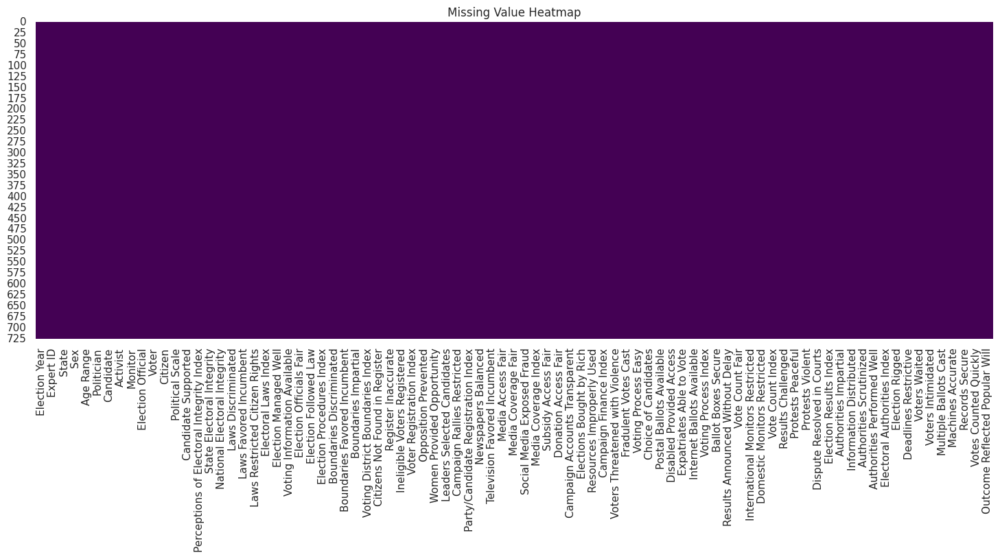

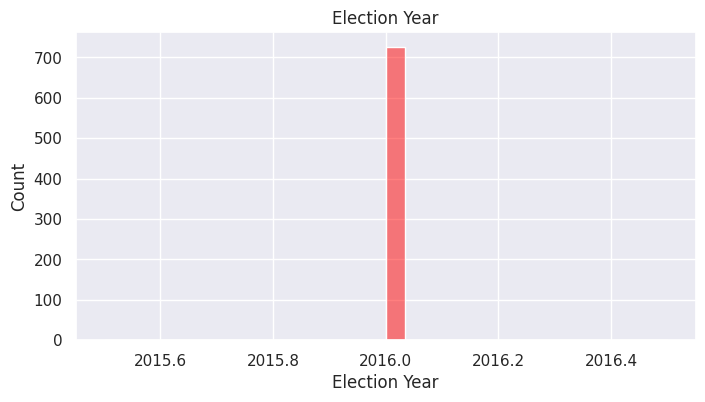

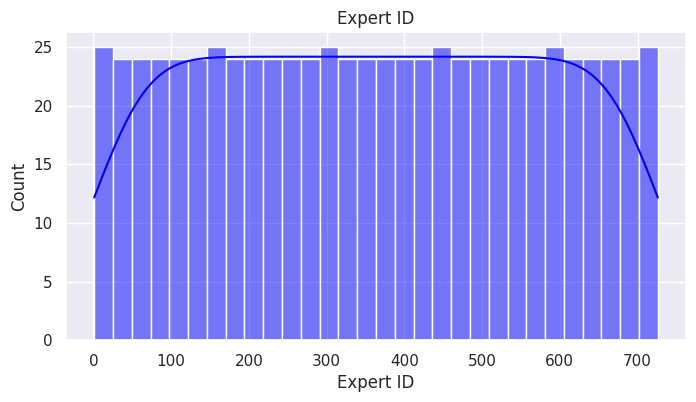

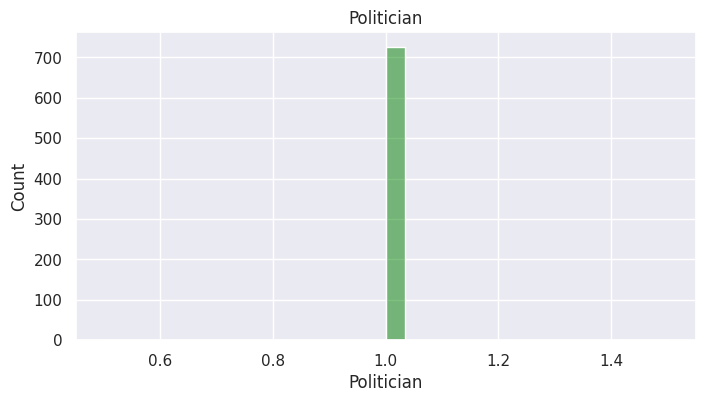

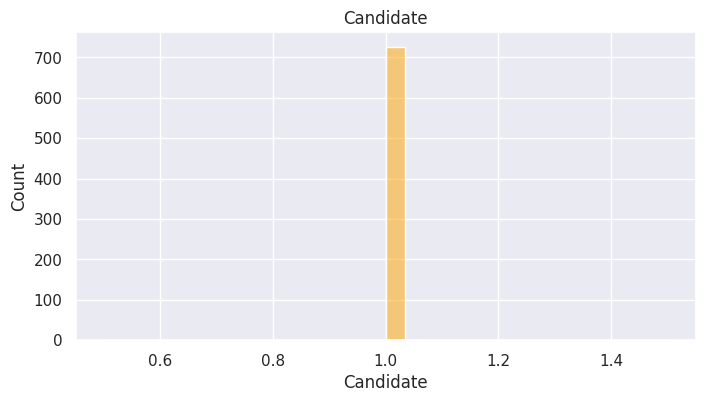

...

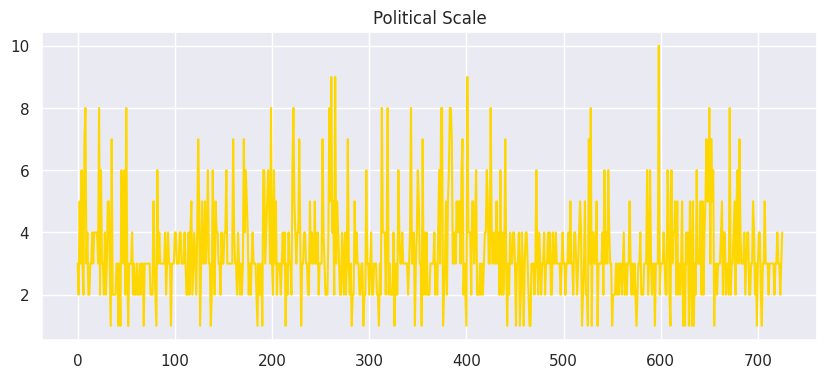

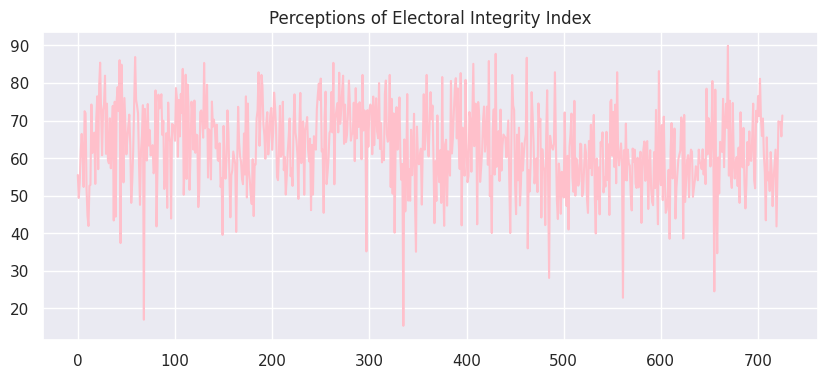

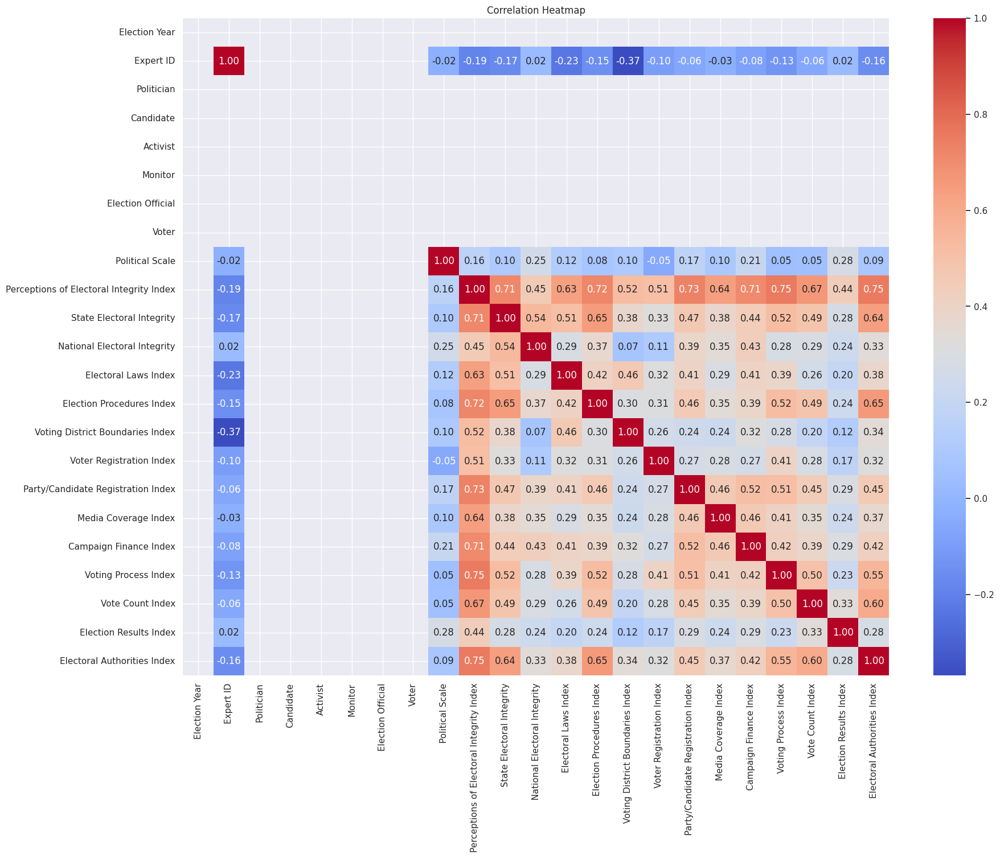

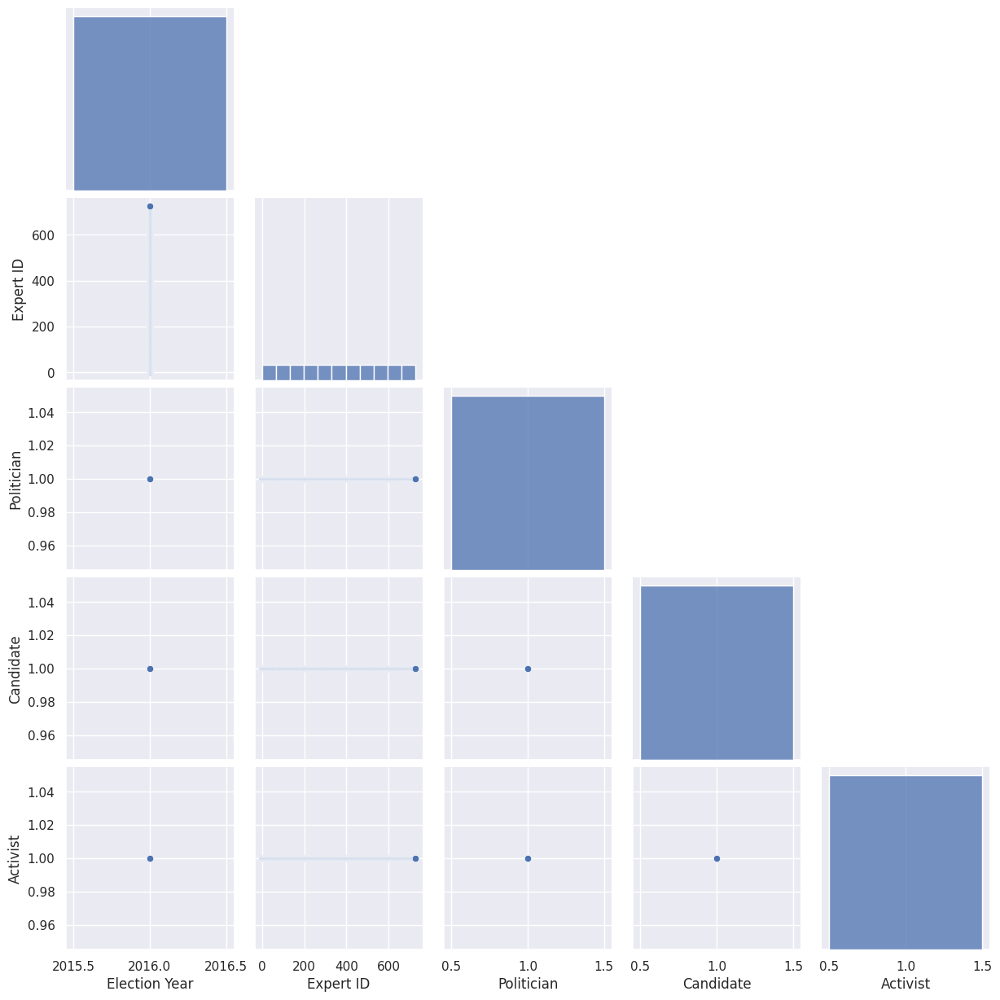

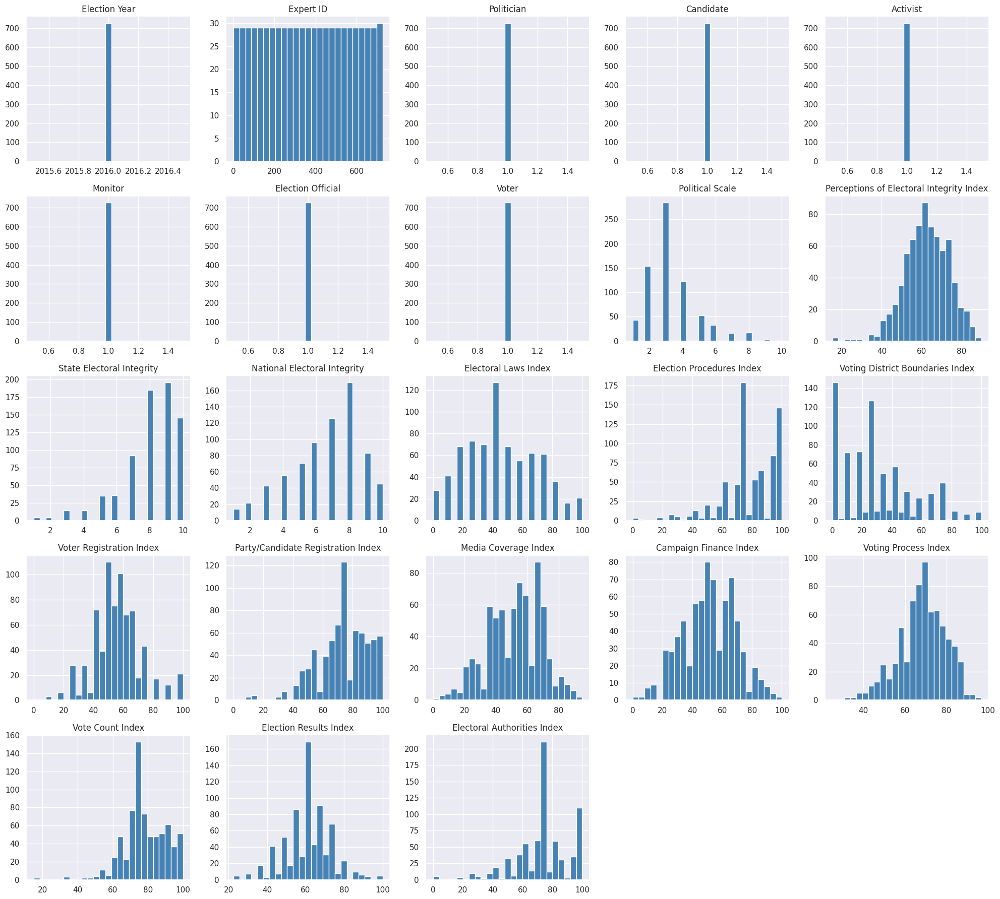

In [12]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.style.use("ggplot")
sns.set(font_scale=1)

data = df.copy()

# ============================================================
# BASIC INFORMATION
# ============================================================

print(data.shape)
print(data.info())
print(data.describe(include="all"))
print(data.isnull().sum())

# ============================================================
# MISSING VALUE HEATMAP
# ============================================================

plt.figure(figsize=(18,6))

sns.heatmap(
    data.isnull(),
    cmap="viridis",
    cbar=False
)

plt.title("Missing Value Heatmap")

plt.show()

# ============================================================
# NUMERIC & CATEGORICAL COLUMNS
# ============================================================

num_cols = data.select_dtypes(include=np.number).columns

cat_cols = data.select_dtypes(include="object").columns

# ============================================================
# HISTOGRAMS
# ============================================================

colors = [
"red","blue","green","orange","purple",
"brown","cyan","magenta","gold","pink",
"olive","teal","navy","darkred","lime"
]

for i,col in enumerate(num_cols):

    plt.figure(figsize=(8,4))

    sns.histplot(
        data[col],
        bins=30,
        kde=True,
        color=colors[i%len(colors)]
    )

    plt.title(col)

    plt.show()

# ============================================================
# BOXPLOTS
# ============================================================

for i,col in enumerate(num_cols):

    plt.figure(figsize=(8,3))

    sns.boxplot(
        x=data[col],
        color=colors[i%len(colors)]
    )

    plt.title(col)

    plt.show()

# ============================================================
# KDE PLOTS
# ============================================================

for i,col in enumerate(num_cols):

    plt.figure(figsize=(8,4))

    sns.kdeplot(
        data[col],
        fill=True,
        color=colors[i%len(colors)]
    )

    plt.title(col)

    plt.show()

# ============================================================
# COUNTPLOTS
# ============================================================

palettes = [
"Set1","Set2","Set3","Accent","Dark2",
"Paired","Pastel1","Pastel2","rocket",
"mako","crest","flare","viridis",
"cubehelix","Spectral"
]

for i,col in enumerate(cat_cols):

    plt.figure(figsize=(10,5))

    vc = data[col].value_counts().head(15)

    sns.barplot(
        x=vc.index,
        y=vc.values,
        palette=palettes[i%len(palettes)]
    )

    plt.xticks(rotation=45)

    plt.title(col)

    plt.tight_layout()

    plt.show()

# ============================================================
# PIE CHARTS
# ============================================================

for col in cat_cols[:10]:

    plt.figure(figsize=(6,6))

    data[col].value_counts().plot(
        kind="pie",
        autopct="%1.1f%%",
        cmap="Set3"
    )

    plt.ylabel("")

    plt.title(col)

    plt.show()

# ============================================================
# VIOLIN PLOTS
# ============================================================

if len(cat_cols)>0:

    for col in num_cols[:10]:

        plt.figure(figsize=(8,5))

        sns.violinplot(
            data=data,
            x=cat_cols[0],
            y=col,
            palette="Set2"
        )

        plt.xticks(rotation=30)

        plt.show()

# ============================================================
# SCATTER PLOTS
# ============================================================

for i in range(min(10,len(num_cols)-1)):

    plt.figure(figsize=(7,5))

    sns.scatterplot(
        x=data[num_cols[i]],
        y=data[num_cols[i+1]],
        color=colors[i]
    )

    plt.title(num_cols[i]+" vs "+num_cols[i+1])

    plt.show()

# ============================================================
# LINE PLOTS
# ============================================================

for i,col in enumerate(num_cols[:10]):

    plt.figure(figsize=(10,4))

    plt.plot(
        data[col],
        color=colors[i]
    )

    plt.title(col)

    plt.show()

# ============================================================
# CORRELATION HEATMAP
# ============================================================

plt.figure(figsize=(20,15))

corr = data[num_cols].corr()

sns.heatmap(
    corr,
    cmap="coolwarm",
    annot=True,
    fmt=".2f"
)

plt.title("Correlation Heatmap")

plt.show()

# ============================================================
# PAIRPLOT
# ============================================================

sns.pairplot(
    data[num_cols[:5]],
    corner=True
)

plt.show()

# ============================================================
# NUMERIC DISTRIBUTION
# ============================================================

data[num_cols].hist(
    figsize=(20,18),
    bins=25,
    color="steelblue"
)

plt.tight_layout()

plt.show()

## Features Engineering


Logistic Regression
Accuracy : 0.363013698630137
Precision: 0.3519434332790497
Recall   : 0.363013698630137
F1 Score : 0.3534277693432755

Classification Report

                            precision    recall  f1-score   support

                     Agree       0.41      0.41      0.41        37
                  Disagree       0.31      0.19      0.24        26
                Don't Know       0.00      0.00      0.00         3
Neither Agree Nor Disagree       0.09      0.08      0.08        13
            Not Applicable       0.00      0.00      0.00         1
            Strongly Agree       0.41      0.47      0.44        34
         Strongly Disagree       0.41      0.50      0.45        32

                  accuracy                           0.36       146
                 macro avg       0.23      0.24      0.23       146
              weighted avg       0.35      0.36      0.35       146



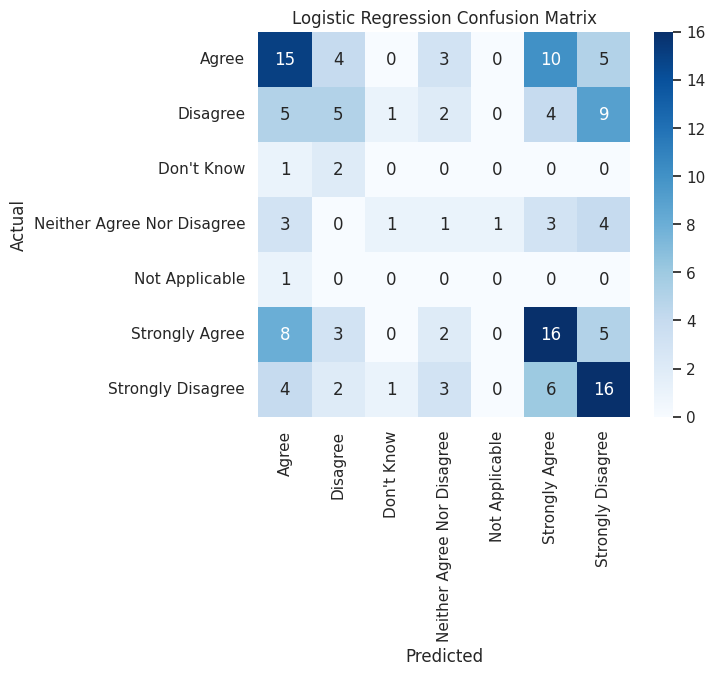

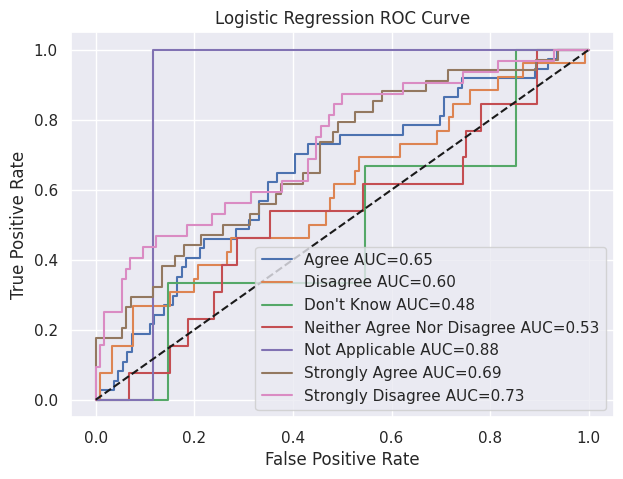

Decision Tree
Accuracy : 0.2602739726027397
Precision: 0.26705052937929646
Recall   : 0.2602739726027397
F1 Score : 0.2597855045218159

Classification Report

                            precision    recall  f1-score   support

                     Agree       0.36      0.27      0.31        37
                  Disagree       0.20      0.27      0.23        26
                Don't Know       0.00      0.00      0.00         3
Neither Agree Nor Disagree       0.14      0.08      0.10        13
            Not Applicable       0.00      0.00      0.00         1
            Strongly Agree       0.33      0.32      0.33        34
         Strongly Disagree       0.23      0.28      0.25        32

                  accuracy                           0.26       146
                 macro avg       0.18      0.17      0.17       146
              weighted avg       0.27      0.26      0.26       146



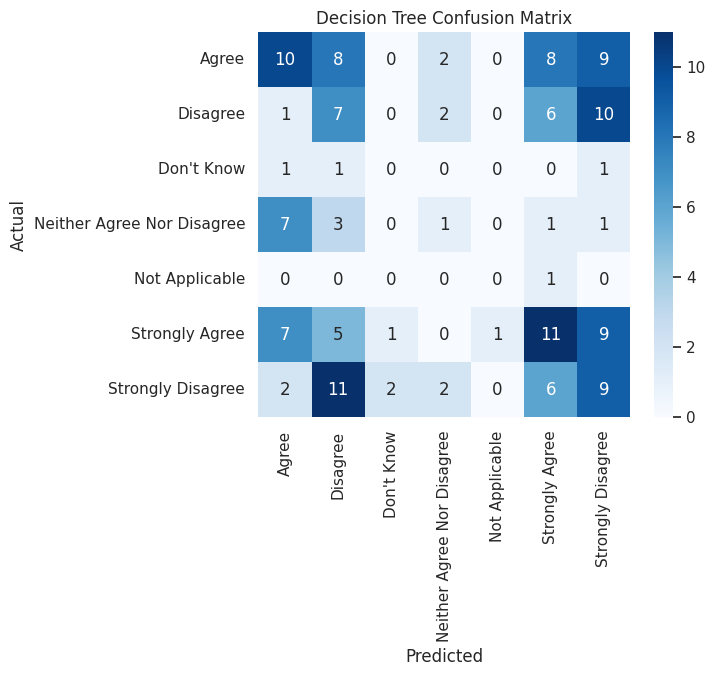

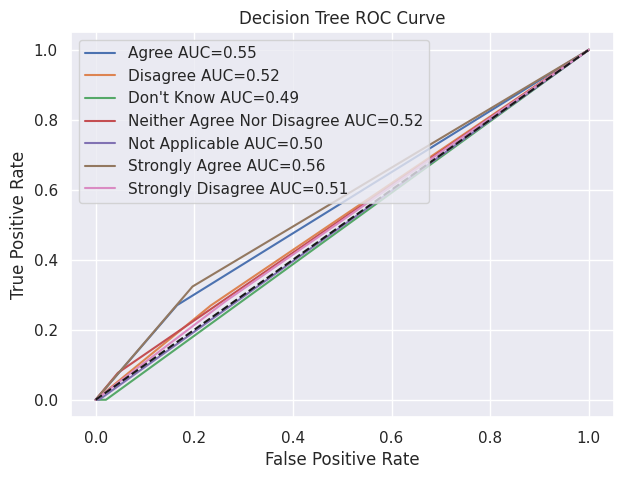

Random Forest
Accuracy : 0.4657534246575342
Precision: 0.41051455285310473
Recall   : 0.4657534246575342
F1 Score : 0.4180809275261017

Classification Report

                            precision    recall  f1-score   support

                     Agree       0.53      0.51      0.52        37
                  Disagree       0.40      0.15      0.22        26
                Don't Know       0.00      0.00      0.00         3
Neither Agree Nor Disagree       0.00      0.00      0.00        13
            Not Applicable       0.00      0.00      0.00         1
            Strongly Agree       0.46      0.68      0.55        34
         Strongly Disagree       0.45      0.69      0.54        32

                  accuracy                           0.47       146
                 macro avg       0.26      0.29      0.26       146
              weighted avg       0.41      0.47      0.42       146



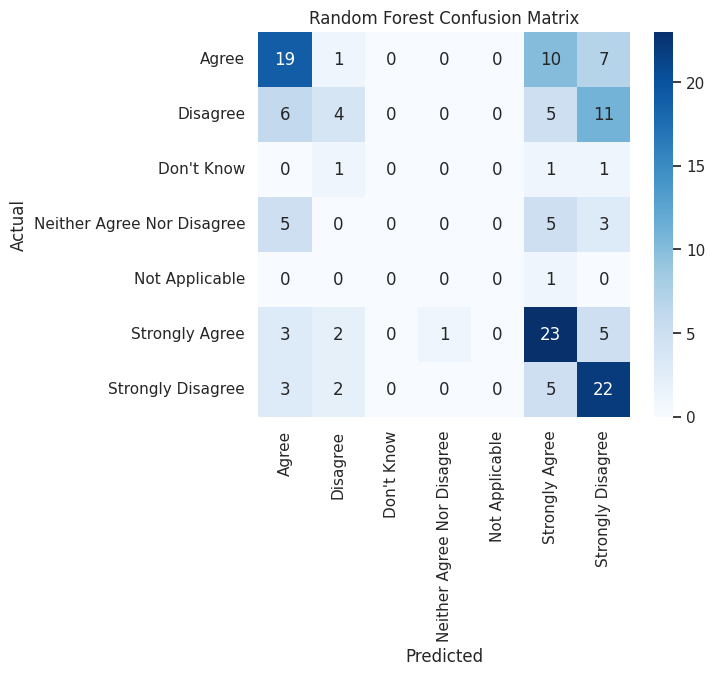

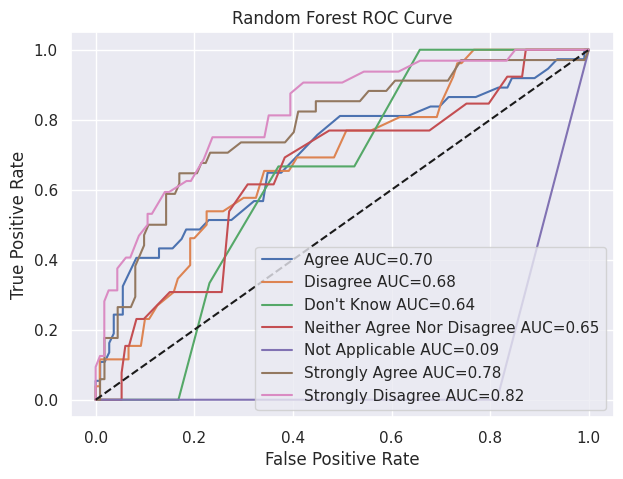

Gradient Boosting
Accuracy : 0.4315068493150685
Precision: 0.3756157097056252
Recall   : 0.4315068493150685
F1 Score : 0.3959863914201814

Classification Report

                            precision    recall  f1-score   support

                     Agree       0.40      0.43      0.42        37
                  Disagree       0.31      0.19      0.24        26
                Don't Know       0.00      0.00      0.00         3
Neither Agree Nor Disagree       0.00      0.00      0.00        13
            Not Applicable       0.00      0.00      0.00         1
            Strongly Agree       0.47      0.65      0.54        34
         Strongly Disagree       0.50      0.62      0.56        32

                  accuracy                           0.43       146
                 macro avg       0.24      0.27      0.25       146
              weighted avg       0.38      0.43      0.40       146



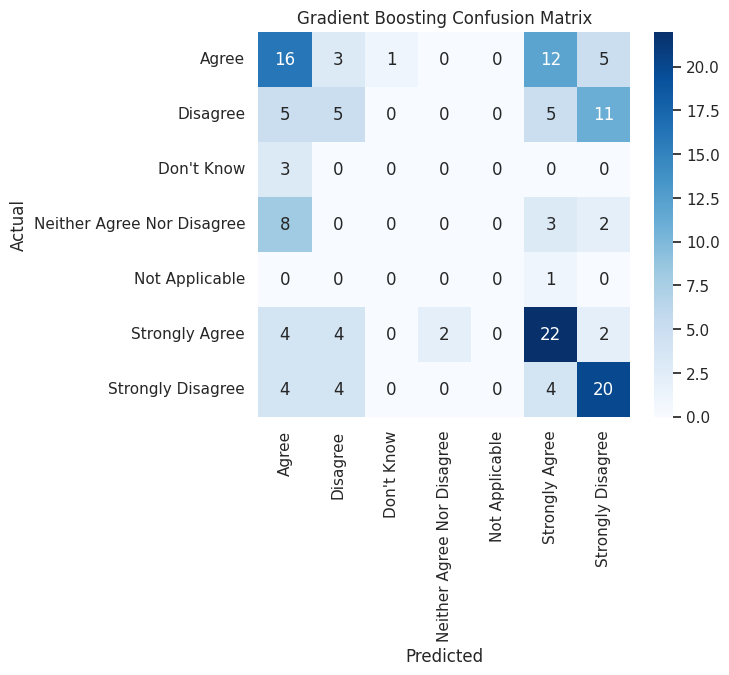

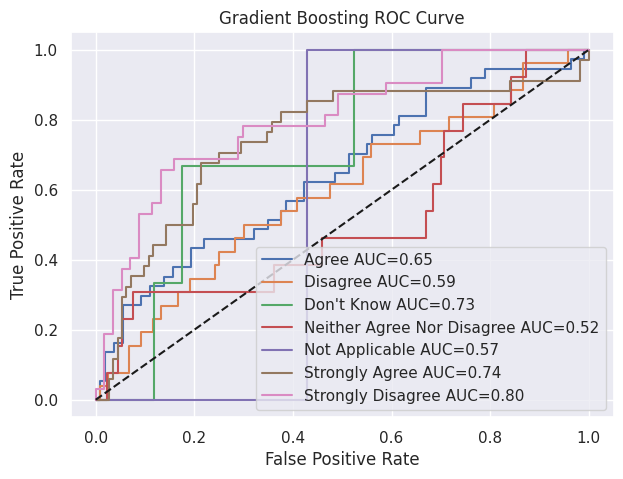

KNN
Accuracy : 0.3287671232876712
Precision: 0.3507650465748774
Recall   : 0.3287671232876712
F1 Score : 0.3159300826513489

Classification Report

                            precision    recall  f1-score   support

                     Agree       0.26      0.54      0.35        37
                  Disagree       0.22      0.15      0.18        26
                Don't Know       0.00      0.00      0.00         3
Neither Agree Nor Disagree       0.00      0.00      0.00        13
            Not Applicable       0.00      0.00      0.00         1
            Strongly Agree       0.50      0.41      0.45        34
         Strongly Disagree       0.59      0.31      0.41        32

                  accuracy                           0.33       146
                 macro avg       0.22      0.20      0.20       146
              weighted avg       0.35      0.33      0.32       146



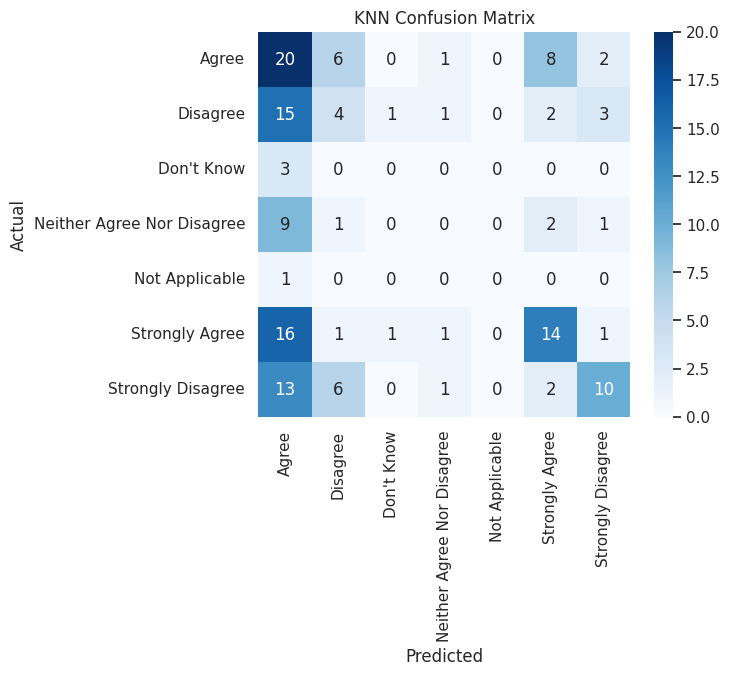

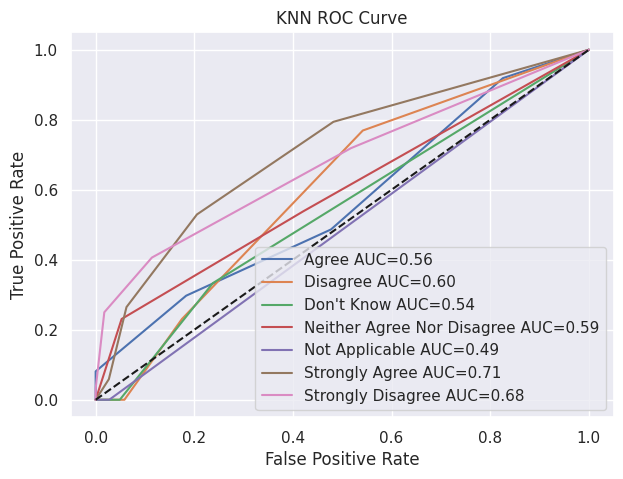

SVM
Accuracy : 0.4520547945205479
Precision: 0.39032707287340646
Recall   : 0.4520547945205479
F1 Score : 0.4128284044871816

Classification Report

                            precision    recall  f1-score   support

                     Agree       0.40      0.43      0.42        37
                  Disagree       0.35      0.23      0.28        26
                Don't Know       0.00      0.00      0.00         3
Neither Agree Nor Disagree       0.00      0.00      0.00        13
            Not Applicable       0.00      0.00      0.00         1
            Strongly Agree       0.44      0.65      0.52        34
         Strongly Disagree       0.56      0.69      0.62        32

                  accuracy                           0.45       146
                 macro avg       0.25      0.29      0.26       146
              weighted avg       0.39      0.45      0.41       146



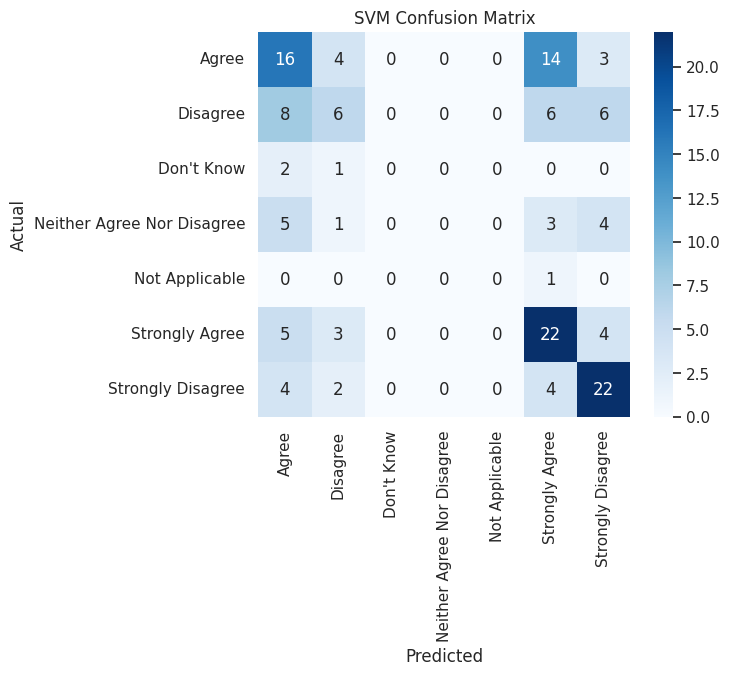

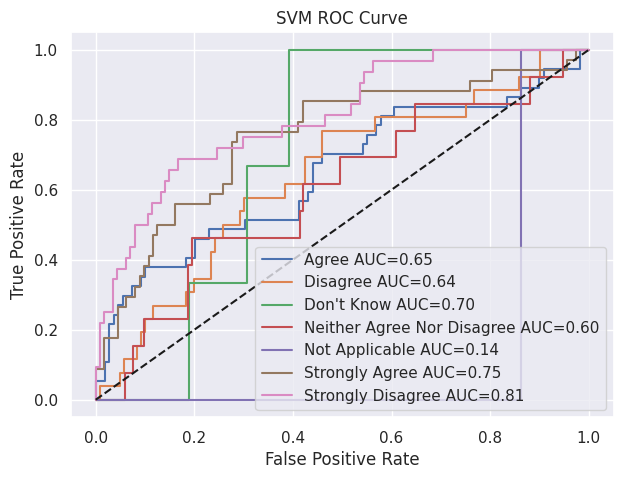

Naive Bayes
Accuracy : 0.136986301369863
Precision: 0.35906727088233936
Recall   : 0.136986301369863
F1 Score : 0.16722586133497588

Classification Report

                            precision    recall  f1-score   support

                     Agree       0.50      0.03      0.05        37
                  Disagree       0.33      0.12      0.17        26
                Don't Know       0.03      0.33      0.05         3
Neither Agree Nor Disagree       0.00      0.00      0.00        13
            Not Applicable       0.02      1.00      0.04         1
            Strongly Agree       0.36      0.24      0.29        34
         Strongly Disagree       0.40      0.19      0.26        32

                  accuracy                           0.14       146
                 macro avg       0.23      0.27      0.12       146
              weighted avg       0.36      0.14      0.17       146



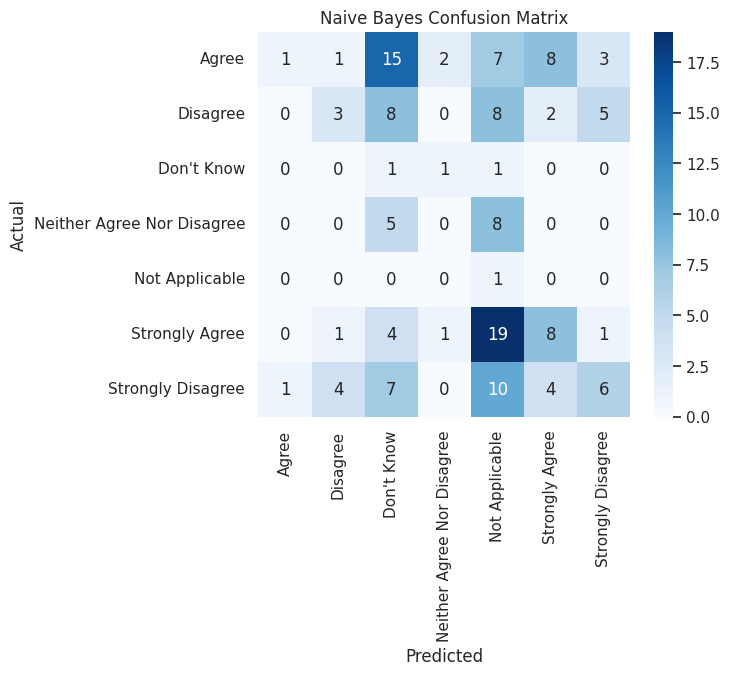

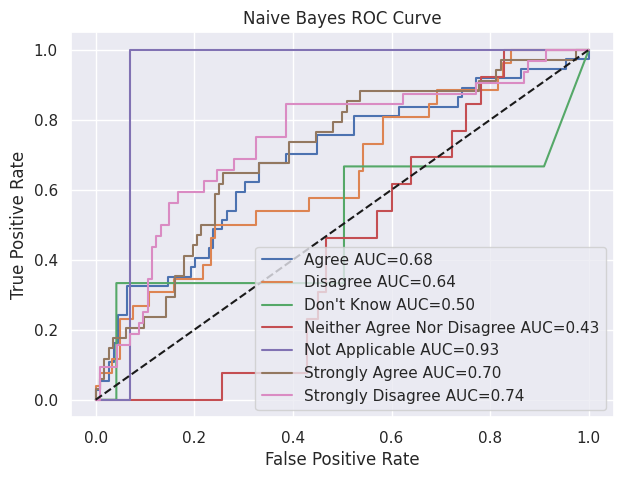


Final Model Comparison

                 Model  Accuracy  Precision    Recall  F1 Score
2        Random Forest  0.465753   0.410515  0.465753  0.418081
5                  SVM  0.452055   0.390327  0.452055  0.412828
3    Gradient Boosting  0.431507   0.375616  0.431507  0.395986
0  Logistic Regression  0.363014   0.351943  0.363014  0.353428
4                  KNN  0.328767   0.350765  0.328767  0.315930
1        Decision Tree  0.260274   0.267051  0.260274  0.259786
6          Naive Bayes  0.136986   0.359067  0.136986  0.167226

Best Model

Model        Random Forest
Accuracy          0.465753
Precision         0.410515
Recall            0.465753
F1 Score          0.418081
Name: 2, dtype: object


In [13]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler, label_binarize
from sklearn.impute import SimpleImputer

from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    classification_report,
    confusion_matrix,
    roc_curve,
    auc
)

# ==========================================================
# ML MODELS
# ==========================================================

from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB

# ==========================================================
# COPY DATA
# ==========================================================

data = df.copy()

# ==========================================================
# REMOVE UNNECESSARY COLUMNS
# ==========================================================

drop_cols = ["Expert ID"]

for col in drop_cols:
    if col in data.columns:
        data.drop(columns=col, inplace=True)

# ==========================================================
# TARGET
# ==========================================================

target = "Outcome Reflected Popular Will"

X = data.drop(columns=[target])
y = data[target]

# ==========================================================
# TRAIN TEST SPLIT
# ==========================================================

X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size=0.20,
    random_state=42,
    stratify=y
)

# ==========================================================
# LABEL ENCODE TARGET
# ==========================================================

target_encoder = LabelEncoder()

y_train = target_encoder.fit_transform(y_train)
y_test = target_encoder.transform(y_test)

# ==========================================================
# ENCODE FEATURES
# ==========================================================

cat_cols = X_train.select_dtypes(include="object").columns

feature_encoders = {}

for col in cat_cols:

    le = LabelEncoder()

    X_train[col] = le.fit_transform(X_train[col].astype(str))

    feature_encoders[col] = le

    X_test[col] = X_test[col].astype(str)

    X_test[col] = X_test[col].apply(
        lambda x:
        le.transform([x])[0]
        if x in le.classes_
        else -1
    )

# ==========================================================
# HANDLE MISSING VALUES
# ==========================================================

imputer = SimpleImputer(strategy="most_frequent")

X_train = pd.DataFrame(
    imputer.fit_transform(X_train),
    columns=X_train.columns
)

X_test = pd.DataFrame(
    imputer.transform(X_test),
    columns=X_test.columns
)

# ==========================================================
# FEATURE SCALING
# ==========================================================

scaler = StandardScaler()

X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# ==========================================================
# MODELS
# ==========================================================

models = {

    "Logistic Regression":
    LogisticRegression(max_iter=5000),

    "Decision Tree":
    DecisionTreeClassifier(random_state=42),

    "Random Forest":
    RandomForestClassifier(
        n_estimators=200,
        random_state=42
    ),

    "Gradient Boosting":
    GradientBoostingClassifier(random_state=42),

    "KNN":
    KNeighborsClassifier(),

    "SVM":
    SVC(probability=True),

    "Naive Bayes":
    GaussianNB()

}

# ==========================================================
# TRAIN & EVALUATE
# ==========================================================

results = []

n_classes = len(target_encoder.classes_)

for name, model in models.items():

    print("="*80)
    print(name)
    print("="*80)

    model.fit(X_train, y_train)

    pred = model.predict(X_test)

    accuracy = accuracy_score(y_test, pred)

    precision = precision_score(
        y_test,
        pred,
        average="weighted",
        zero_division=0
    )

    recall = recall_score(
        y_test,
        pred,
        average="weighted",
        zero_division=0
    )

    f1 = f1_score(
        y_test,
        pred,
        average="weighted",
        zero_division=0
    )

    print("Accuracy :", accuracy)
    print("Precision:", precision)
    print("Recall   :", recall)
    print("F1 Score :", f1)

    labels = np.unique(np.concatenate([y_test, pred]))

    print("\nClassification Report\n")

    print(
        classification_report(
            y_test,
            pred,
            labels=labels,
            target_names=target_encoder.inverse_transform(labels),
            zero_division=0
        )
    )

    cm = confusion_matrix(
        y_test,
        pred,
        labels=labels
    )

    plt.figure(figsize=(6,5))

    sns.heatmap(
        cm,
        annot=True,
        fmt="d",
        cmap="Blues",
        xticklabels=target_encoder.inverse_transform(labels),
        yticklabels=target_encoder.inverse_transform(labels)
    )

    plt.title(name + " Confusion Matrix")

    plt.xlabel("Predicted")
    plt.ylabel("Actual")

    plt.show()

    # ROC CURVE
    if hasattr(model, "predict_proba"):

        probs = model.predict_proba(X_test)

        y_bin = label_binarize(
            y_test,
            classes=np.arange(n_classes)
        )

        plt.figure(figsize=(7,5))

        for i in range(n_classes):

            if np.sum(y_bin[:, i]) == 0:
                continue

            fpr, tpr, _ = roc_curve(
                y_bin[:, i],
                probs[:, i]
            )

            roc_auc = auc(fpr, tpr)

            plt.plot(
                fpr,
                tpr,
                label=f"{target_encoder.classes_[i]} AUC={roc_auc:.2f}"
            )

        plt.plot([0,1],[0,1],"k--")

        plt.title(name + " ROC Curve")

        plt.xlabel("False Positive Rate")
        plt.ylabel("True Positive Rate")

        plt.legend()

        plt.show()

    results.append([
        name,
        accuracy,
        precision,
        recall,
        f1
    ])

# ==========================================================
# MODEL COMPARISON
# ==========================================================

results = pd.DataFrame(
    results,
    columns=[
        "Model",
        "Accuracy",
        "Precision",
        "Recall",
        "F1 Score"
    ]
)

results = results.sort_values(
    by="Accuracy",
    ascending=False
)

print("\nFinal Model Comparison\n")

print(results)

# ==========================================================
# BEST MODEL
# ==========================================================

print("\nBest Model\n")
print(results.iloc[0])

## Thanks.............Please Upvote